In [1]:
import sys
import os

# Add the parent directory to the system path
sys.path.append(os.path.abspath(os.path.dirname(os.getcwd())))

import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from Graph import GenericGraph
from collections import defaultdict
from networkx.algorithms.community.quality import modularity
from visualise_communities import visualise_communities

# for leiden's algo
import leidenalg as la
import igraph as ig

# for Infomap and Wlatertrap
from cdlib import algorithms

Note: to be able to use all crisp methods, you need to install some additional packages:  {'bayanpy', 'wurlitzer', 'infomap', 'graph_tool'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'ASLPAw', 'pyclustering'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'wurlitzer', 'infomap'}


The analysis and remarks can be found in readme.md within the task2 folder

NameError: name 'GenericGraph' is not defined

Max modularity: 0.4642334627453675
Community 0:
	mali
	luxembourg
	kiribati
	gibraltar
	iceland
	hong kong
	curaçao
	bangladesh
	hungary
	germany
	djibouti
	israel
	greenland
	ireland
	bouvet island
	poland
	guernsey
	chad
	dominica
	dominican republic
	burundi
	central african republic
	christmas island
	malawi
	haiti
	iraq
	thailand
	denmark
	fiji
	kosovo
	italy
	congo
	finland
Community 1:
	french polynesia
	algeria
	western sahara
	albania
	malta
	american samoa
	libya
	kenya
	malaysia
	mauritania
	angola
	liberia
	austria
	tunisia
	botswana
	cambodia
	guatemala
	guinea
	mongolia
	czechia
	panama
	india
	lithuania
	french guiana
	cuba
	afghanistan
	antarctica
	united states of america
	georgia
	zambia
	anguilla
	gambia
	bermuda
	bosnia and herzegovina
	australia
	ghana
	argentina
	croatia
	canada
	antigua and barbuda
	romania
	grenada
	china
	costa rica
	rwanda
	colombia
	latvia
	armenia
	guyana
	tonga
	aruba
	indonesia
	andorra
	azerbaijan
	bulgaria
	wallis and futuna
	papua new g

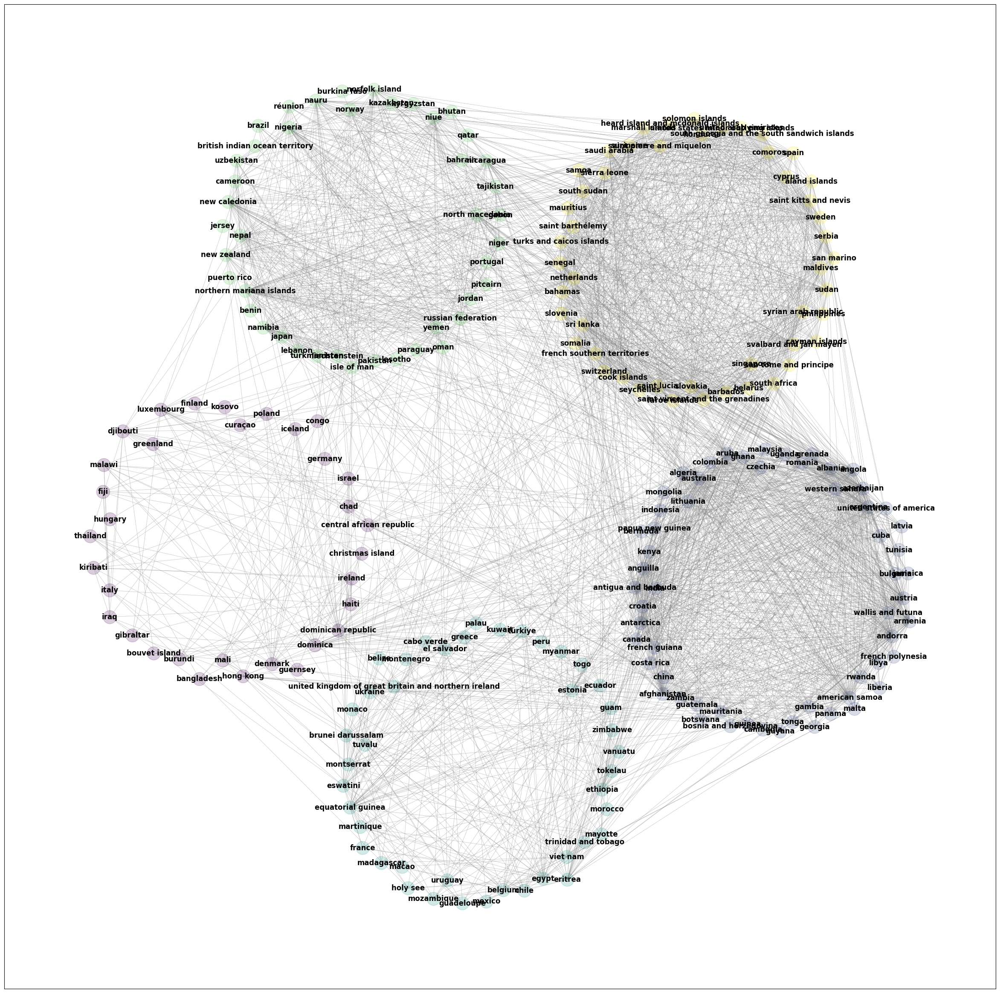

In [10]:
# Louvain's Algorithm 
def Louvain():
    g = GenericGraph(graph_type="country").graph
    max_modularity = -1
    best_partition = None
    for _ in range(100):
        partition = nx.community.louvain_communities(g)
        mod = modularity(g, partition)
        if mod > max_modularity:
            max_modularity = mod
            best_partition = partition
    print(f'Max modularity: {max_modularity}')
    visualise_communities(g, best_partition)

Louvain()


Max modularity: 0.47377067131329487
Community 0:
	antarctica
	libya
	croatia
	lithuania
	mongolia
	tonga
	tunisia
	antigua and barbuda
	uganda
	czechia
	malaysia
	armenia
	romania
	cuba
	cambodia
	french guiana
	latvia
	argentina
	costa rica
	guatemala
	bermuda
	jamaica
	mauritania
	azerbaijan
	grenada
	malta
	bosnia and herzegovina
	afghanistan
	panama
	western sahara
	zambia
	guinea
	andorra
	american samoa
	french polynesia
	india
	canada
	georgia
	australia
	indonesia
	guyana
	papua new guinea
	liberia
	anguilla
	algeria
	albania
	angola
	rwanda
	kenya
	gambia
	aruba
	united states of america
	botswana
	bulgaria
	colombia
	ghana
	china
	wallis and futuna
	austria
Community 1:
	suriname
	switzerland
	honduras
	singapore
	somalia
	serbia
	syrian arab republic
	turks and caicos islands
	samoa
	saint lucia
	åland islands
	san marino
	saint vincent and the grenadines
	barbados
	solomon islands
	saint kitts and nevis
	comoros
	united states minor outlying islands
	cyprus
	senegal
	marsha

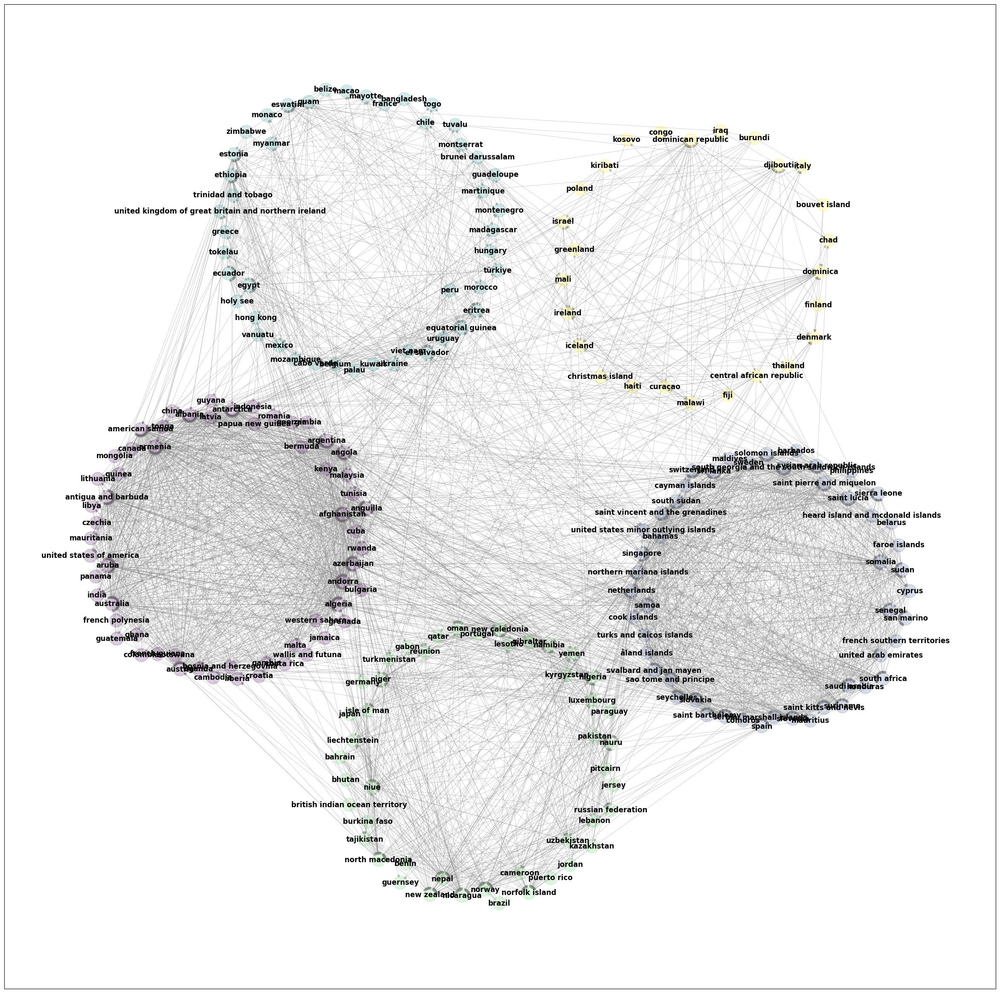

In [4]:

def Leiden():

    g = GenericGraph(graph_type="country").graph
    igraph = ig.Graph.from_networkx(g)
    igraph.vs["name"] = list(g.nodes())
    max_modularity = -1
    best_partition = None
    for _ in range(100):
        communities = la.find_partition(igraph, la.ModularityVertexPartition)
        partition = [set(igraph.vs[node]["name"] for node in community) for community in communities]

        mod = modularity(g, partition)
        if mod > max_modularity:
            max_modularity = mod
            best_partition = partition
    print(f'Max modularity: {max_modularity}')
    # print(best_partition)
    visualise_communities(g, best_partition)
    
Leiden()

0.46016691591375214
Community 0:
	antarctica
	libya
	croatia
	lithuania
	mongolia
	tonga
	tunisia
	antigua and barbuda
	uganda
	czechia
	malaysia
	armenia
	romania
	cuba
	cambodia
	french guiana
	latvia
	argentina
	costa rica
	guatemala
	bermuda
	jamaica
	mauritania
	azerbaijan
	grenada
	malta
	bosnia and herzegovina
	afghanistan
	panama
	western sahara
	zambia
	guinea
	andorra
	american samoa
	french polynesia
	india
	canada
	georgia
	australia
	indonesia
	guyana
	papua new guinea
	liberia
	anguilla
	algeria
	albania
	angola
	rwanda
	kenya
	gambia
	aruba
	united states of america
	botswana
	bulgaria
	colombia
	ghana
	china
	wallis and futuna
	austria
Community 1:
	suriname
	central african republic
	honduras
	switzerland
	singapore
	somalia
	serbia
	syrian arab republic
	turks and caicos islands
	samoa
	saint lucia
	åland islands
	san marino
	saint vincent and the grenadines
	barbados
	solomon islands
	saint kitts and nevis
	comoros
	united states minor outlying islands
	cyprus
	seneg

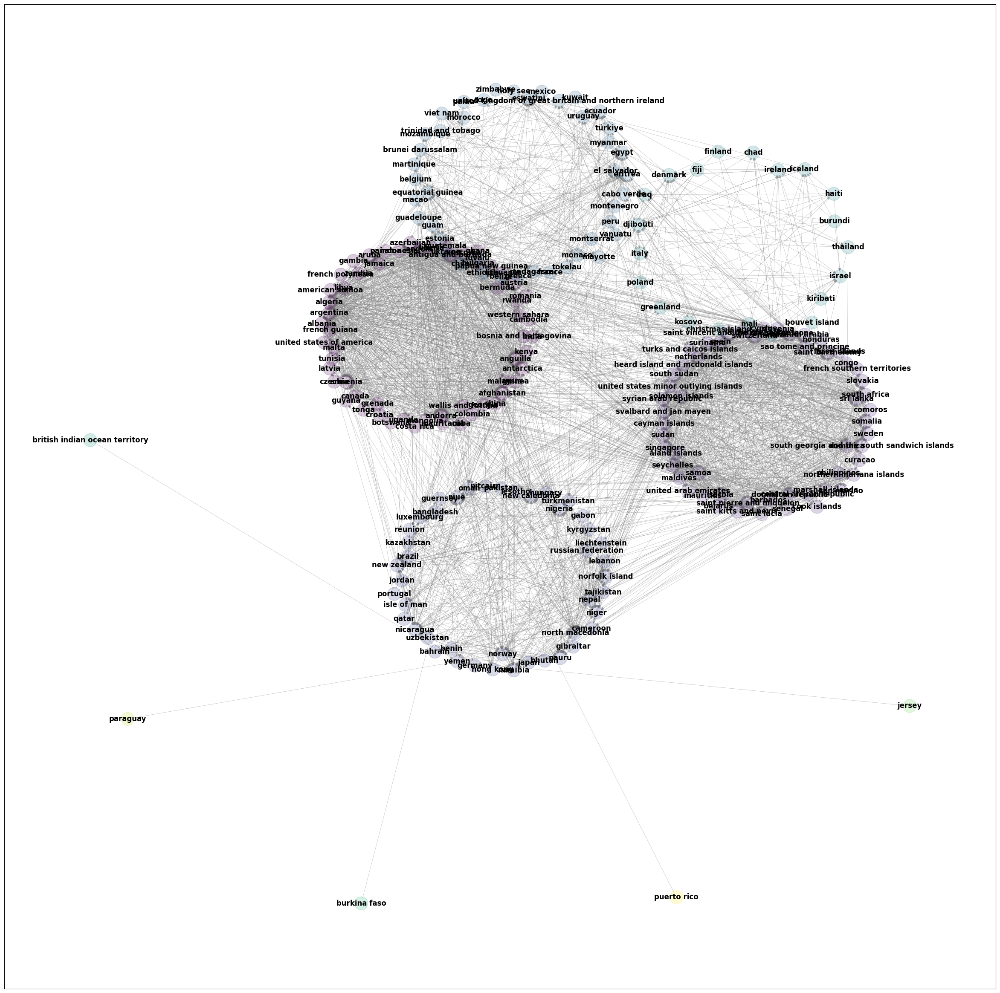

In [12]:
from cdlib import algorithms
from Graph import GenericGraph

def Walktrap():
    g = GenericGraph(graph_type="country").graph
    nc = algorithms.walktrap(g)
    communities = [set(c) for c in nc.communities]
    print(modularity(g, communities))
    visualise_communities(g, communities)

Walktrap()

0.352930775161812
Community 0:
	benin
	pakistan
	western sahara
	mauritania
	guyana
	malta
	guatemala
	bulgaria
	bhutan
	new caledonia
	american samoa
	algeria
	jamaica
	tonga
	austria
	nicaragua
	croatia
	canada
	afghanistan
	pitcairn
	guinea
	costa rica
	gambia
	georgia
	french guiana
	hong kong
	bermuda
	azerbaijan
	cuba
	ghana
	antarctica
	jordan
	malaysia
	grenada
	bahrain
	colombia
	french polynesia
	mongolia
	japan
	panama
	wallis and futuna
	tunisia
	namibia
	bosnia and herzegovina
	cambodia
	china
	armenia
	nigeria
	argentina
	australia
	antigua and barbuda
	andorra
	albania
	angola
	anguilla
	north macedonia
	zambia
	aruba
	papua new guinea
	botswana
	czechia
Community 1:
	marshall islands
	saint vincent and the grenadines
	honduras
	bangladesh
	cyprus
	philippines
	south georgia and the south sandwich islands
	spain
	sweden
	faroe islands
	northern mariana islands
	netherlands
	south africa
	barbados
	somalia
	saint kitts and nevis
	belarus
	saint lucia
	slovenia
	seychelles

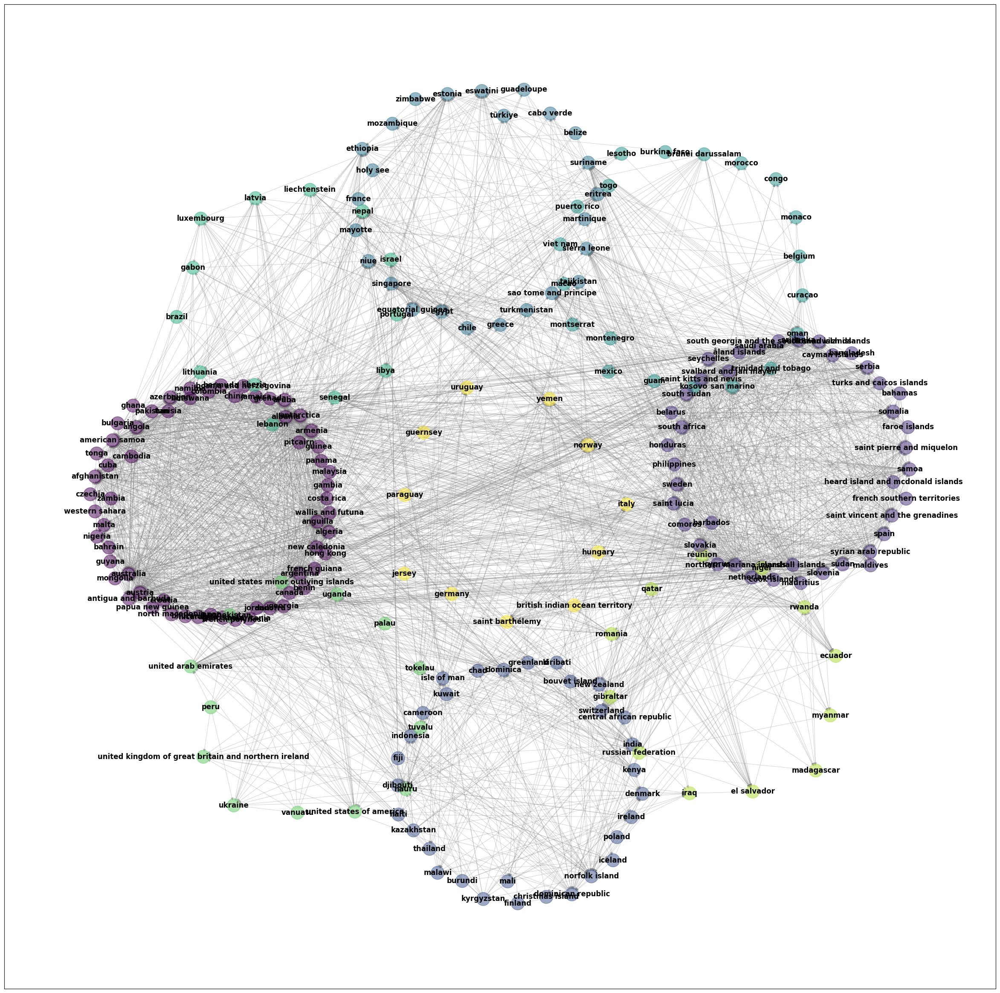

In [2]:
# Info Map
def InfoMap():
    g = GenericGraph(graph_type="country").graph
    nc = algorithms.infomap(g)
    communities = [set(c) for c in nc.communities]
    print(modularity(g, communities))
    visualise_communities(g, communities)

InfoMap() 